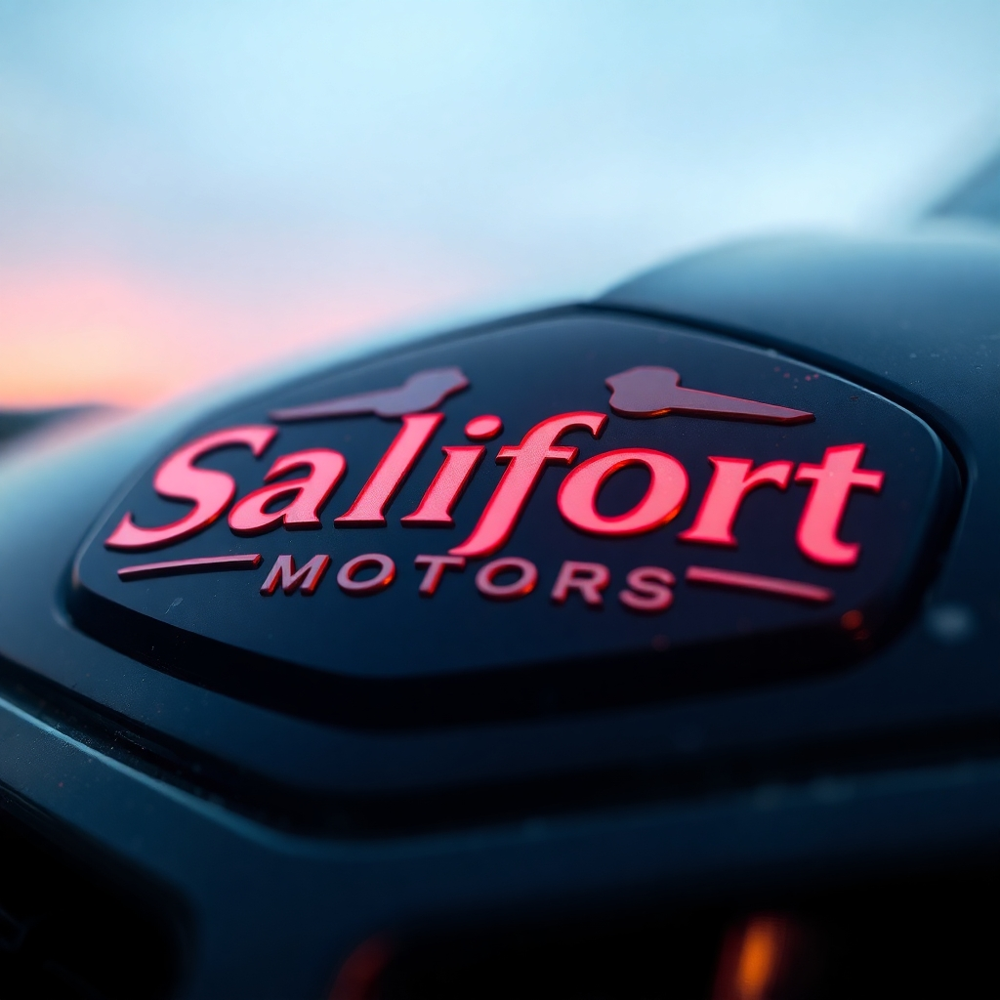

# **Predicting Employee Attrition at Salifort Motors**
## **EDA & Visualization**

# **Introduction**

This Jupyter Notebook serves as the exploratory data analysis (EDA) step in the employee turnover prediction project for Salifort Motors. The goal is to uncover key patterns, trends, and insights that will inform data-driven decisions and subsequent modeling.

**Objectives of This Notebook:**

* **Exploratory Data Analysis** – Conduct a structured examination of the dataset, using visualizations and statistical summaries to identify trends, correlations, and potential factors influencing employee attrition.  
* **Key Insights Extraction** – Analyse tenure, satisfaction, workload, and salary levels to understand attrition patterns, forming hypotheses that will guide feature selection and predictive modeling.  

By the end of this notebook, we will have a clear understanding of the data and key drivers of employee turnover, setting the stage for model development in the next phase.

<br>

## **Business Scenario & Problem**

Salifort Motors is experiencing high employee turnover, leading to increased recruitment costs, operational disruptions, and productivity loss. The HR department has collected survey data from employees and wants to understand why employees leave and how to improve retention.

To address this, Salifort’s leadership has tasked me, their data analytics professional, with uncovering key drivers of turnover. My role is to analyze the survey dataset and develop a predictive model that forecasts which employees are most likely to leave.

By accurately identifying risk factors (such as workload, department, tenure, or salary level), HR can implement targeted retention strategies to enhance employee satisfaction and reduce hiring and training costs.

<br>

## **Data Dictionary**

This [Dataset](https://www.kaggle.com/datasets/mfaisalqureshi/hr-analytics-and-job-prediction?select=HR_comma_sep.csv) is a cleaned version of the one available in the linked source and includes:
* **11,991 rows** - each row is a different employee's self-reported information
* **10 columns**
* And the following variables

Variable  |Description |
-----|-----|
`satisfaction_level`|Employee-reported job satisfaction level [0&ndash;1]|
`last_evaluation`|Score of employee's last performance review [0&ndash;1]|
`number_project`|Number of projects employee contributes to|
`average_monthly_hours`|Average number of hours employee worked per month|
`company_tenure`|How long the employee has been with the company in years (changed from `time_spend_company`)
`work_accident`|Whether or not the employee experienced an accident while at work
`left`|Whether or not the employee left the company
`promotion_last_5years`|Whether or not the employee was promoted in the last 5 years
`department`|The employee's department
`salary`|The employee's salary (U.S. dollars)

<br>

## **Contents**  

#### **Setup and Data Initialization**  
1️⃣ Import Libraries and Packages  
2️⃣ Import Dataset  
3️⃣ Data Validation  

#### **Exploratory Data Analysis (EDA)**  
4️⃣ Understanding Attrition Trends  
5️⃣ Workload & Performance Impact  
6️⃣ Salary, Promotions & Growth Impact  
7️⃣ Job Satisfaction & Employee Retention  
8️⃣ Departmental Trends & Attrition Risk  
9️⃣ Correlation & Predictive Factors  

#### **Final Thoughts**  
🔟 Summary of Insights  
1️⃣1️⃣ Business Recommendations to Reduce Attrition at Salifort Motors  
1️⃣2️⃣ Conclusion  

<br>

# **Setup and Initionalization**
## **1️⃣ Import Libraries and Packages**

**Import** necessary libraries for data manipulation, visualization, and modelling.

In [1]:
# Import packages for data manipulation and visualization
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import IPython.display as display
from sklearn.preprocessing import LabelEncoder
from lifelines import KaplanMeierFitter
import plotly.graph_objects as go
from tabulate import tabulate
from IPython.display import display

<br>

## **2️⃣ Import Dataset**

**Load** the dataset into a DataFrame for exploration and analysis.

In [2]:
# Read in dataset
data_cleaned = pd.read_csv(r'C:\Users\danet\Documents\HR_capstone_dataset_cleaned.csv')

<br>

## **3️⃣ Data Validation**

**Inspect** first five rows

In [3]:
data_cleaned.head()

,satisfaction_level,last_evaluation,number_project,average_monthly_hours,company_tenure,work_accident,left,promotion_last_5years,department,salary
0,0.38,0.53,2,157,3,0,1,0,sales,low
1,0.80,0.86,5,262,6,0,1,0,sales,medium
2,0.11,0.88,7,272,4,0,1,0,sales,medium
3,0.72,0.87,5,223,5,0,1,0,sales,low
4,0.37,0.52,2,159,3,0,1,0,sales,low


<br>

**View** basic information about the data

In [4]:
data_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11991 entries, 0 to 11990
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   satisfaction_level     11991 non-null  float64
 1   last_evaluation        11991 non-null  float64
 2   number_project         11991 non-null  int64  
 3   average_monthly_hours  11991 non-null  int64  
 4   company_tenure         11991 non-null  int64  
 5   work_accident          11991 non-null  int64  
 6   left                   11991 non-null  int64  
 7   promotion_last_5years  11991 non-null  int64  
 8   department             11991 non-null  object 
 9   salary                 11991 non-null  object 
dtypes: float64(2), int64(6), object(2)
memory usage: 936.9+ KB


<br>

**Generate** descriptive statistics

In [5]:
data_cleaned.describe()

,satisfaction_level,last_evaluation,number_project,average_monthly_hours,company_tenure,work_accident,left,promotion_last_5years
count,11991.000000,11991.000000,11991.000000,11991.000000,11991.000000,11991.000000,11991.000000,11991.000000
mean,0.629658,0.716683,3.802852,200.473522,3.364857,0.154282,0.166041,0.016929
std,0.241070,0.168343,1.163238,48.727813,1.330240,0.361234,0.372133,0.129012
min,0.090000,0.360000,2.000000,96.000000,2.000000,0.000000,0.000000,0.000000
25%,0.480000,0.570000,3.000000,157.000000,3.000000,0.000000,0.000000,0.000000
50%,0.660000,0.720000,4.000000,200.000000,3.000000,0.000000,0.000000,0.000000
75%,0.820000,0.860000,5.000000,243.000000,4.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,7.000000,310.000000,10.000000,1.000000,1.000000,1.000000


<br>

# **Exploratory Data Analysis (EDA)**

## **4️⃣ Understanding Attrition Trends**

### 📊 **Attrition Overview (Understanding the Target Variable)**  
**Goal**: Understand the overall attrition rate and establish a baseline before deeper analysis.

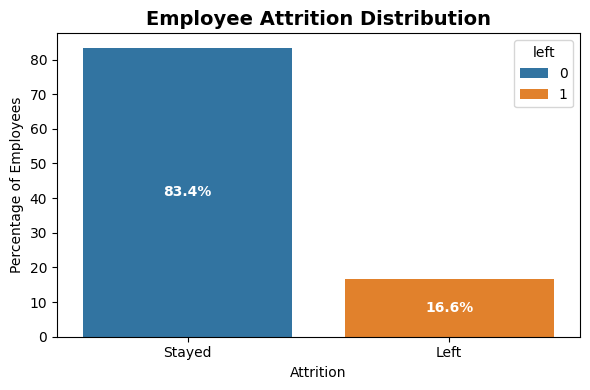

,left,count,percentage
0,0,10000,83.39588
1,1,1991,16.60412


In [6]:
# Count the number of employees who stayed vs. left
attrition_counts = data_cleaned['left'].value_counts().reset_index()
attrition_counts.columns = ['left', 'count']
attrition_counts['percentage'] = (attrition_counts['count'] / attrition_counts['count'].sum()) * 100

# 📌 Bar Chart: Attrition Distribution
plt.figure(figsize=(6, 4))
barplot = sns.barplot(x='left', y='percentage', data=attrition_counts, hue='left')

# Add percentage labels in the center
for container in barplot.containers:
    barplot.bar_label(container, fmt="%.1f%%", label_type="center", fontsize=10, color="white", fontweight="bold")

# Formatting
plt.title("Employee Attrition Distribution", fontsize=14, fontweight="bold")
plt.xlabel("Attrition")
plt.ylabel("Percentage of Employees")
plt.xticks([0, 1], ["Stayed", "Left"])

# Display Plot
plt.tight_layout()
plt.show()

# Display Table Summary
attrition_summary = pd.DataFrame(attrition_counts)
display(attrition_summary)

#### 🔍 ***Key Insights:*** 

* The attrition distribution shows that **1,991 (16.6%)** of employees have left the company, while **10,000 (83.4%)** have stayed, indicating a moderate turnover rate. While the majority of employees remain, understanding the drivers of this **1 in 6** departures is crucial for implementing targeted retention strategies to reduce hiring costs and improve workforce stability.
* The target variable exhibits a clear class imbalance, with significantly more employees staying than leaving.
* This imbalance could impact model performance, as predictive models may be biased toward the majority class (employees who stay).
* To mitigate this, resampling techniques (oversampling the minority class or undersampling the majority) or class weighting should be considered when training models.

#### 💡 ***Summary:***

The company experiences a moderate turnover rate, with 1,991 employees (16.6%) leaving while 10,000 (83.4%) remain, highlighting that 1 in 6 employees depart. Understanding the key drivers of attrition is essential for developing targeted retention strategies that can help reduce hiring costs and improve workforce stability.

Additionally, the attrition dataset exhibits a class imbalance, with significantly more employees staying than leaving. This imbalance may affect predictive model performance, as models could be biased toward the majority class (employees who stay). To enhance model accuracy, resampling techniques (such as oversampling the minority class or undersampling the majority) or class weighting should be applied to ensure a balanced representation in the training process.

<br>

### 📊 **Identifying Attrition Risk by Tenure**  
**Goal**: Identify when employees tend to leave, pinpoint tenure periods where attrition spikes, and compare absolute exits vs. attrition rates to assess retention risk.

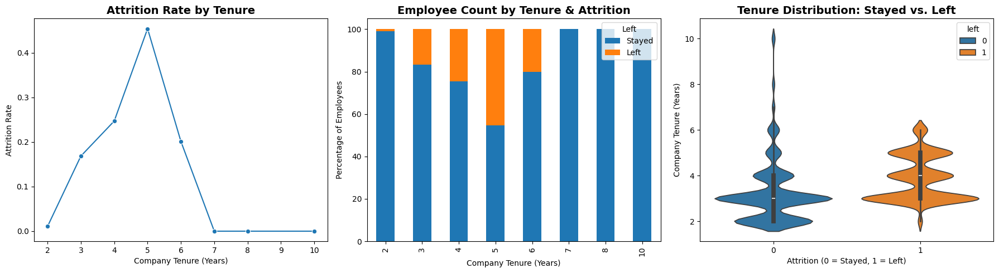

In [7]:
# Ensure data is sorted by tenure
data_cleaned = data_cleaned.sort_values(by='company_tenure')

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# 📌 Line Chart: Attrition Rate per Tenure Year
tenure_attrition_rate = data_cleaned.groupby('company_tenure')['left'].mean()
sns.lineplot(x=tenure_attrition_rate.index, y=tenure_attrition_rate.values, marker='o', ax=axes[0])
axes[0].set_title("Attrition Rate by Tenure", fontsize=14, fontweight="bold")
axes[0].set_xlabel("Company Tenure (Years)")
axes[0].set_ylabel("Attrition Rate")

# 📌 Stacked Bar Chart: Employee Count by Tenure & Attrition
tenure_counts = data_cleaned.groupby(['company_tenure', 'left']).size().unstack(fill_value=0)
tenure_counts_norm = tenure_counts.div(tenure_counts.sum(axis=1), axis=0) * 100  # Convert to %
tenure_counts_norm.plot(kind='bar', stacked=True, ax=axes[1])
axes[1].set_title("Employee Count by Tenure & Attrition", fontsize=14, fontweight="bold")
axes[1].set_xlabel("Company Tenure (Years)")
axes[1].set_ylabel("Percentage of Employees")
axes[1].legend(title="Left", labels=["Stayed", "Left"])

# 📌 Violin Plot: Distribution of Tenure for Left vs. Stayed
sns.violinplot(x='left', y='company_tenure', data=data_cleaned, hue='left', ax=axes[2])
axes[2].set_title("Tenure Distribution: Stayed vs. Left", fontsize=14, fontweight="bold")
axes[2].set_xlabel("Attrition (0 = Stayed, 1 = Left)")
axes[2].set_ylabel("Company Tenure (Years)")

plt.tight_layout()
plt.show()

In [8]:
# Group data by tenure and calculate required values
attrition_table = data_cleaned.groupby("company_tenure").agg(
    employees_in_group=("left", "count"),
    employees_who_left=("left", "sum")  # Since 'left' is 1 if they left, summing gives count of those who left
).reset_index()

# Calculate attrition rate and round to 2 decimal places
attrition_table["attrition_rate_(%)"] = ((attrition_table["employees_who_left"] / attrition_table["employees_in_group"]) * 100).round(2)

# Display the table
attrition_table

,company_tenure,employees_in_group,employees_who_left,attrition_rate_(%)
0,2,2910,31,1.07
1,3,5190,874,16.84
2,4,2005,495,24.69
3,5,1062,482,45.39
4,6,542,109,20.11
5,7,94,0,0.00
6,8,81,0,0.00
7,10,107,0,0.00


#### 🔍 ***Key Insights:*** 

**Peak Attrition Occurs Between 3–5 Years**  
* Employees in their 3rd, 4th, and 5th years exhibit the highest turnover.
* 5-year tenure has the highest attrition rate (45.4%), marking a critical risk point.

**Steep Decline in Attrition Beyond 6 Years**  
* Employees who surpass 6 years are far less likely to leave.
* Tenure of 7+ years shows almost no attrition, suggesting strong long-term retention.

**Absolute Exits vs. Attrition Rate: Understanding Risk**  
* 3-year tenure has the highest number of exits (874 employees left), but its attrition rate (16.8%) is lower than at 5 years (45.4%).
* This suggests more employees leave at 3 years simply due to higher headcount, whereas 5 years represents a more severe retention risk.

**Bimodal Distribution of Tenure Among Those Who Leave**  
* Employees who leave are clustered between 2–6 years, with a median of 4 years.
* Very few employees leave at 7+ years, reinforcing the stability of long-tenured employees.

#### 💡 ***Summary:***

Attrition peaks at 5 years (45.39%), signaling a critical retention risk. However, employees who stay beyond 6 years rarely leave, suggesting that long-tenured employees experience factors that reinforce loyalty. Investigating whether high-performing employees are more likely to leave between 4-6 years and whether long-tenured employees maintain consistent or improving performance will help determine the effectiveness of promotion pathways, leadership training, work-life balance policies, and salary reassessments in reducing turnover among mid-career employees.

<br>

### 📊 **Performance Trends & Why Employees Leave**  

**Goal**: Assess whether high-performing employees are more likely to leave between Years 4-6 and whether long-tenured employees maintain consistent or improving performance to determine effective retention strategies.

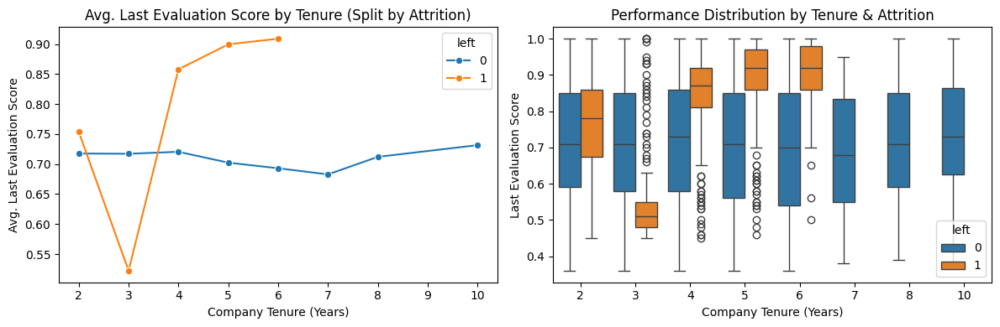

In [9]:
# Aggregate data for line plot: Calculate mean last evaluation per tenure year by attrition status
eval_tenure = data_cleaned.groupby(["company_tenure", "left"])["last_evaluation"].mean().reset_index()

# Set figure size and layout
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

# 📌 Line Plot: Average Last Evaluation Score by Tenure & Attrition
sns.lineplot(data=eval_tenure, x="company_tenure", y="last_evaluation", hue="left", marker="o", ax=axes[0])
axes[0].set_title("Avg. Last Evaluation Score by Tenure (Split by Attrition)")
axes[0].set_xlabel("Company Tenure (Years)")
axes[0].set_ylabel("Avg. Last Evaluation Score")

# 📌 Boxplot: Last Evaluation Score Distribution by Tenure & Attrition
sns.boxplot(data=data_cleaned, x="company_tenure", y="last_evaluation", hue="left", ax=axes[1])
axes[1].set_title("Performance Distribution by Tenure & Attrition")
axes[1].set_xlabel("Company Tenure (Years)")
axes[1].set_ylabel("Last Evaluation Score")

# Adjust layout for readability
plt.tight_layout()
plt.show()

#### 🔍 ***Key Insights:***  

**Low Performance & 3-Year Attrition**

* Employees who left at 3 years have noticeably low last evaluation scores, suggesting underperformance-related exits (potentially firings or dismissals).

**High Performers Leaving Between 4-6 Years**

* Those who left between 4-6 years show high evaluation scores, indicating voluntary departures of strong performers—likely due to feeling undervalued, lacking career progression, or seeking better opportunities.

**Stable Performance Among Long-Tenured Employees**

* Employees who stay longer than 6 years tend to have consistent and slightly increasing performance scores.
* This suggests those who remain long-term are well-integrated, engaged, and may receive ongoing career growth opportunities.

**Boxplot Confirms Trends**

* The distribution in the boxplot mirrors the line plot, reinforcing that employees who stay for the long haul maintain steady performance.

#### 💡 ***Summary:***

High-performing employees are disproportionately leaving between 4-6 years, where last evaluation scores reach 0.90 before attrition, while those who stay maintain lower but stable performance (0.65-0.70) across all tenure levels. This trend suggests that a lack of career progression, recognition, or incentives may be driving top talent to seek opportunities elsewhere, making targeted promotion pathways and retention incentives critical for mid-tenure employees.

This analysis ties back perfectly to the tenure and attrition trends, providing a performance-based layer of insight into who is leaving and why which leads us to our next section.

<br>

### 📊 **Work Accidents & Employee Retention: Survival Analysis**  

**Goal**: Analyze the impact of work accidents on employee retention. Identify critical tenure milestones where employees with past accidents are more likely to leave, helping assess whether workplace safety incidents contribute to higher attrition risk.

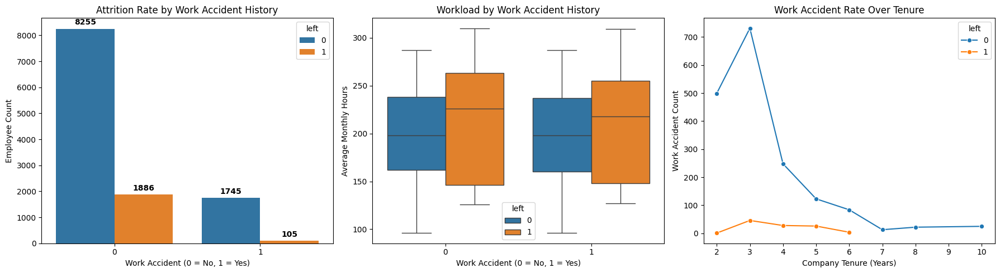

In [10]:
# Set figure size and layout for subplots (1 row, 3 columns)
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# 📌 Grouped Bar Chart: Attrition Rate by Work Accident History
work_accident_counts = data_cleaned.groupby(['work_accident', 'left']).size().reset_index(name='count')
barplot = sns.barplot(data=work_accident_counts, x="work_accident", y="count", hue="left", ax=axes[0])

# Annotate total counts on each bar
for container in barplot.containers:
    barplot.bar_label(container, fmt="%.0f", fontsize=10, fontweight="bold", padding=3)
    
# Set labels and title
axes[0].set_title("Attrition Rate by Work Accident History")
axes[0].set_xlabel("Work Accident (0 = No, 1 = Yes)")
axes[0].set_ylabel("Employee Count")

# 📌 Boxplot: Workload by Work Accident History (Stayed vs. Left)
sns.boxplot(data=data_cleaned, x="work_accident", y="average_monthly_hours", hue="left", ax=axes[1])

# Set labels and title
axes[1].set_title("Workload by Work Accident History")
axes[1].set_xlabel("Work Accident (0 = No, 1 = Yes)")
axes[1].set_ylabel("Average Monthly Hours")

# 📌 Line Chart: Work Accident Rate Over Tenure
work_accident_tenure = data_cleaned.groupby(["company_tenure", "left"])["work_accident"].sum().reset_index()
sns.lineplot(data=work_accident_tenure, x="company_tenure", y="work_accident", marker="o", hue="left", ax=axes[2])

# Set labels and title
axes[2].set_title("Work Accident Rate Over Tenure")
axes[2].set_xlabel("Company Tenure (Years)")
axes[2].set_ylabel("Work Accident Count")

# Adjust layout for readability
plt.tight_layout()
plt.show()

#### 🔍 ***Key Insights:***  
**Work accidents are not a major driver of attrition:**
* Employees with no work accident history make up the majority of both those who stay and leave. Employees who experienced work accidents have a slightly lower attrition rate.

**Workload levels are similar regardless of accident history:**
* Employees who had work accidents show a similar distribution of average monthly hours as those who did not, indicating that workload alone is not a strong predictor of accidents.

**Work accident rates decline sharply with tenure:**
* Employees with 2-4 years of tenure experience the highest number of work accidents, after which the rate drops significantly. This suggests that less experienced employees are at a higher risk of workplace incidents, possibly due to unfamiliarity with safety protocols or job demands.

#### 💡 ***Summary:***

Work accidents appear to have minimal impact on attrition, as employees with accident histories leave at slightly lower rates than those without. Workload levels remain consistent across both groups, indicating that excessive hours do not directly contribute to accident risk. However, work accident rates are highest among employees with 2-4 years of tenure and decline significantly thereafter, suggesting that newer employees may be more prone to workplace incidents, potentially due to inexperience or insufficient safety training.

<br>

### 📊 **Employee Retention Over Time: Survival Analysis**  

**Goal**: Determine and quantifying survival probabilities of employees remaining at the company over time, identifying critical tenure milestones where retention drops significantly.

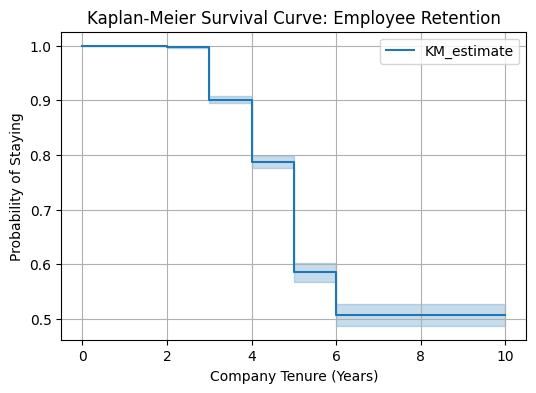

In [11]:
# Initialize Kaplan-Meier Fitter
kmf = KaplanMeierFitter()

# Fit the model
kmf.fit(durations=data_cleaned["company_tenure"], event_observed=data_cleaned["left"])

# Set figure size and layout
plt.figure(figsize=(6, 4))

# 📌 Kaplan-Meier Survival Curve: Employee Retention
kmf.plot_survival_function()
plt.title("Kaplan-Meier Survival Curve: Employee Retention")
plt.xlabel("Company Tenure (Years)")
plt.ylabel("Probability of Staying")
plt.grid(True)

# Show plot
plt.show()

#### 🔍 ***Key Insights:***

* Retention probability remains high at ~90% by Year 3 but drops sharply to ~60% by Year 5, confirming that 4-6 years is the highest-risk period for attrition.
* However, beyond 6 years, retention probability stabilizes at ~51% with no further recorded exits, indicating that long-tenured employees are significantly more likely to remain.

<br>

## **5️⃣ Workload & Performance Impact**

### 📊 **Workload & Employee Attrition: Impact of Project Load & Monthly Hours**
**Goal**: Evaluate how workload—measured by project count and monthly hours—correlates with attrition to identify potential burnout thresholds.

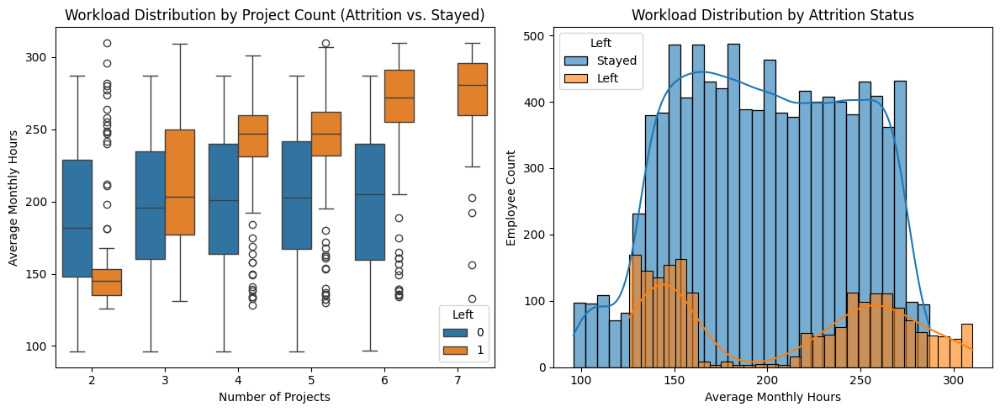

In [12]:
# Set figure size and layout
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# 📌 Boxplot: Average Monthly Hours Distribution by Number of Projects (Stayed vs. Left)
sns.boxplot(data=data_cleaned, x="number_project", y="average_monthly_hours", hue="left", ax=axes[0])
axes[0].set_title("Workload Distribution by Project Count (Attrition vs. Stayed)")
axes[0].set_xlabel("Number of Projects")
axes[0].set_ylabel("Average Monthly Hours")
axes[0].legend(title="Left")

# 📌 Histogram: Workload (average_monthly_hours) Distribution (Stayed vs. Left)
sns.histplot(data=data_cleaned[data_cleaned['left'] == 0], 
             x='average_monthly_hours', 
             kde=True, 
             bins=30, 
             color="#1f77b4", 
             label="Stayed", 
             alpha=0.6, 
             ax=axes[1])  # Use subplot axis

sns.histplot(data=data_cleaned[data_cleaned['left'] == 1], 
             x='average_monthly_hours', 
             kde=True, 
             bins=30, 
             color="#ff7f0e", 
             label="Left", 
             alpha=0.6, 
             ax=axes[1])  # Use subplot axis

# Set title and labels for histogram
axes[1].set_title("Workload Distribution by Attrition Status")
axes[1].set_xlabel("Average Monthly Hours")
axes[1].set_ylabel("Employee Count")
axes[1].legend(title="Left")

# Adjust layout for readability
plt.tight_layout()
plt.show()

#### 🔍 ***Key Insights:***  
**Attrition Peaks at Moderate Workloads (125-160 Hours/Month)**: 
* The highest attrition rates occur among employees working ~125-160 monthly hours, suggesting that both voluntary exits (due to disengagement or lack of growth) and involuntary exits (due to underperformance) may be driving turnover at this workload level.

**High Workload (250+ Hours) Still Contributes to Attrition**:
* Employees assigned 6+ projects (250+ hours/month) also experience high attrition risk, though they represent a smaller portion of total exits compared to the moderate workload group.

**Retention is Strongest in the 160-225 Hour Range**:
* Employees with balanced workloads (160-225 hours/month) show the highest retention rates, suggesting this is an optimal workload range for stability.  

**Work Overload Becomes a Risk Factor at 3+ Projects**:
* Employees with 3+ projects consistently worked more hours and had higher attrition than those with fewer projects, confirming that attrition risk increases as workload intensity rises.  

#### 💡 ***Summary:***  
Attrition peaks at moderate workloads (125-160 hours/month), driven by both voluntary exits (disengagement or lack of growth) and involuntary exits (perceived underperformance). However, burnout-driven attrition becomes nearly unavoidable at 7 projects, where employees regularly exceed 250+ monthly hours, and almost no one stays. While 6 projects also present a high burnout risk, some employees still manage to remain. Retention is strongest in the 160-225 hour range, emphasizing the importance of workload balance to prevent both disengagement and burnout.

<br>

### 📊 **Workload Stability vs. Attrition Risk: How Tenure Shapes Employee Exit Patterns**
**Goal**: Analyze how workload fluctuations influence employee retention across tenure stages.

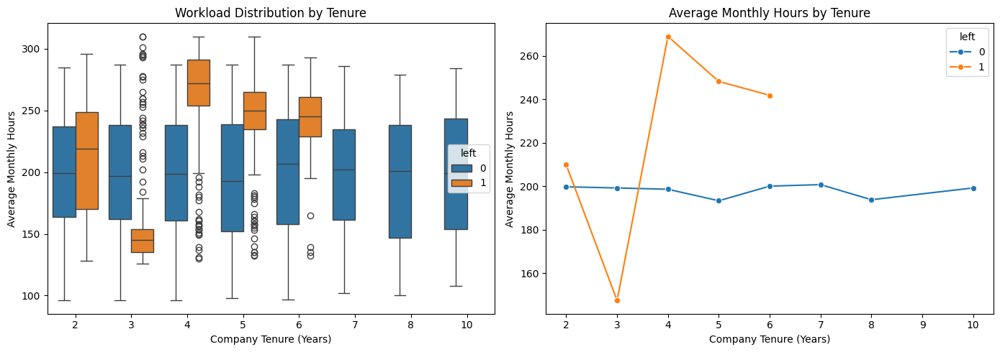


Average Monthly Hours: 200.47


In [13]:
# Set figure size and layout for subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# 📌 Boxplot: Workload Distribution by Tenure
sns.boxplot(data=data_cleaned, x="company_tenure", y="average_monthly_hours", hue="left", ax=axes[0])
axes[0].set_title("Workload Distribution by Tenure")
axes[0].set_xlabel("Company Tenure (Years)")
axes[0].set_ylabel("Average Monthly Hours")

# Aggregate data for Line Plot **(Group by company_tenure & left)**
workload_by_tenure = (
    data_cleaned.groupby(["company_tenure", "left"])["average_monthly_hours"]
    .mean()
    .reset_index()
)

# 📌 Line Plot: Average Monthly Hours by Tenure
sns.lineplot(data=workload_by_tenure, x="company_tenure", y="average_monthly_hours", marker="o", hue="left", ax=axes[1])
axes[1].set_title("Average Monthly Hours by Tenure")
axes[1].set_xlabel("Company Tenure (Years)")
axes[1].set_ylabel("Average Monthly Hours")

# Adjust layout for readability
plt.tight_layout()
plt.show()

print()
print(f"Average Monthly Hours: {data_cleaned['average_monthly_hours'].mean():.2f}")

#### 🔍 ***Key Insights:***

**Employees who left had extreme workload fluctuations**: 
* The line plot shows sharp workload volatility among those who left, particularly a steep drop at Year 3 (<160 hours) followed by a spike at Year 4 (270 hours), suggesting erratic workload changes may contribute to attrition.

**Attrition at Year 3 aligns with performance trends**: 
* This workload drop at Year 3 matches the sharp decline in last evaluation scores from the previous analysis, reinforcing that underperformance or reduced workload may lead to forced exits at this stage.

**High workload at Year 4-6 coincides with peak attrition risk**: 
* Employees who left had workloads exceeding 250+ hours from Year 4 onwards, aligning with earlier findings that burnout becomes a major attrition factor beyond 4 years.

**Stable workload among retained employees**:
* Those who stayed maintained relatively steady workloads (180-220 hours) across all tenure levels, supporting the idea that workload balance contributes to long-term retention.

#### 💡 ***Summary:***
Employees who left experienced erratic workload fluctuations, particularly a drop at Year 3 (160 hours) followed by a spike at Year 4 (270 hours), mirroring earlier performance score declines at Year 3. High workloads beyond 250+ hours at Years 4-6 coincide with peak attrition risk, reinforcing burnout as a major factor. Meanwhile, those who stayed had stable workloads (180-220 hours), highlighting workload balance as key to retention. Later-tenure leavers (6+ years) had lower workloads, suggesting disengagement or career stagnation rather than burnout as their primary exit drivers.

<br>

### 📊 **Workload, Satisfaction & Performance: How Overwork Affects Employee Retention**
**Goal**: Analyze the relationship between workload, satisfaction, performance, and promotions to understand why employees leave.

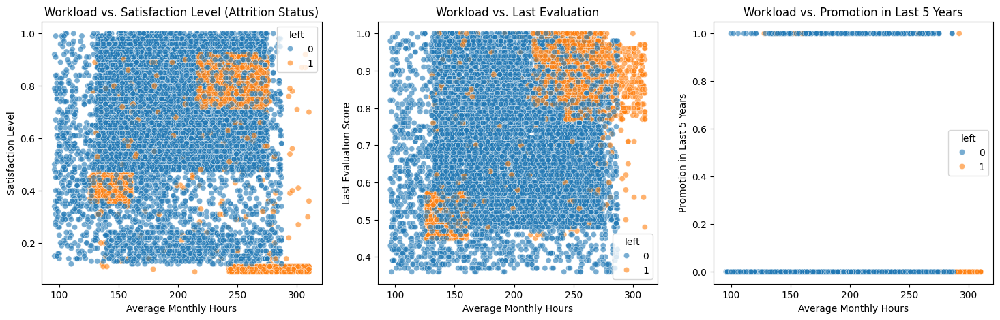

In [14]:
# Set figure size and layout for subplots (1 row, 3 columns)
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# 📌 Scatterplot 1: Workload vs. Satisfaction Level (Stayed vs. Left)
sns.scatterplot(data=data_cleaned, x="average_monthly_hours", y="satisfaction_level", hue="left", alpha=0.6, ax=axes[0])
axes[0].set_title("Workload vs. Satisfaction Level (Attrition Status)")
axes[0].set_xlabel("Average Monthly Hours")
axes[0].set_ylabel("Satisfaction Level")

# 📌 Scatterplot 2: Workload vs. Last Evaluation
sns.scatterplot(data=data_cleaned, x="average_monthly_hours", y="last_evaluation", hue="left", alpha=0.6, ax=axes[1])
axes[1].set_title("Workload vs. Last Evaluation")
axes[1].set_xlabel("Average Monthly Hours")
axes[1].set_ylabel("Last Evaluation Score")

# 📌 Scatterplot 3: Workload vs. Promotion in Last 5 Years
sns.scatterplot(data=data_cleaned, x="average_monthly_hours", y="promotion_last_5years", hue="left", alpha=0.6, ax=axes[2])
axes[2].set_title("Workload vs. Promotion in Last 5 Years")
axes[2].set_xlabel("Average Monthly Hours")
axes[2].set_ylabel("Promotion in Last 5 Years")

# Adjust layout for readability
plt.show()

#### 🔍 ***Key Insights:***

**Unsatisfied employees who left were concentrated in two key areas:**: 
* Extremely low satisfaction (0.1) with extreme workloads (>250 hours/month), reinforcing burnout as a key attrition driver.
* Moderately low satisfaction (0.4) with below-average workloads (150 hours/month), suggesting disengagement or lack of role fit.

**Workload-Driven Attrition Among Satisfied Employees**:  
* A subset of fairly satisfied employees (satisfaction 0.7-0.9) left while carrying higher-than-average workloads (225-275 hours/month), suggesting that workload stress—rather than dissatisfaction—was the primary driver of their exit. This indicates that even engaged employees may leave when workload demands become unsustainable.

**High Performers with Extreme Workloads Are Leaving**:
* Employees who left also had high last evaluation scores (>0.8) and high workloads (>225 hours/month), confirming that even top performers are at risk of burnout-related exits.

**Lack of Promotions Among High-Workload Leavers**: 
* Employees who left at high workloads (250+ hours) were overwhelmingly not promoted, suggesting that a lack of career progression, despite heavy workload, contributes to attrition.

**Low-Performing and Low-Satisfaction Employees Also Leave**: 
* Another group of leavers had both low satisfaction and low last evaluation scores (0.4-0.5), indicating that some exits may be driven by disengagement or performance-related terminations.

#### 💡 ***Summary:***

Employees who left were concentrated in two key areas—those with extremely low satisfaction (0.1) and high workloads (>250 hours/month), reinforcing burnout as a major attrition risk, and those with moderately low satisfaction (0.4) and below-average workloads (150 hours/month), suggesting disengagement or lack of role fit. Additionally, a subset of fairly satisfied employees (0.7-0.9 satisfaction) left despite carrying high workloads (225-275 hours/month), indicating that workload stress alone can drive attrition even among engaged employees.  

High-performing employees (>0.8 last evaluation) with workloads exceeding 225 hours/month also left, confirming that top talent is not immune to burnout-related exits. Employees who left at high workloads (>250 hours) were also overwhelmingly not promoted, reinforcing that heavy workloads without career growth accelerate attrition. Lastly, some leavers had both low satisfaction and low last evaluation scores (0.4-0.5), suggesting that disengagement or underperformance may have played a role in their exits.

<br>

## **6️⃣ Salary, Promotions & Growth Impact**

### 📊 **Salary, Tenure & Attrition: How Compensation Influences Retention**  
**Goal**: Examine how salary levels impact attrition risk and how salary distribution differs between short-tenured and long-tenured employees.

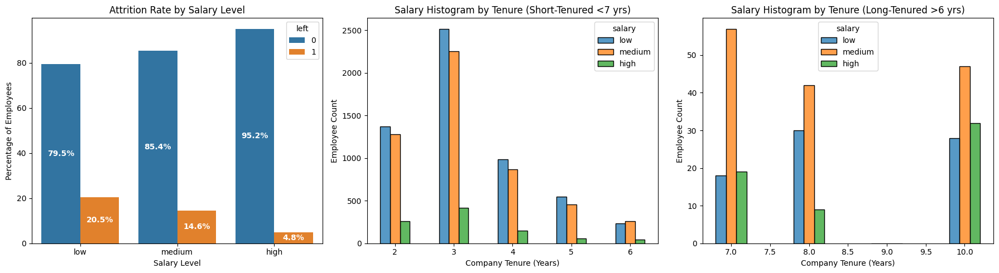

In [15]:
# Define salary order for consistency
salary_order = ['low', 'medium', 'high']

# Define groups based on tenure
short_tenure = data_cleaned[data_cleaned["company_tenure"] < 7]  # Potential leavers (<7 years)
long_tenure = data_cleaned[data_cleaned["company_tenure"] > 6]  # Long-term stayers (>6 years)

# Set figure size and layout for subplots (1 row, 3 columns)
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# 📌 Grouped Bar Chart: Attrition Rate by Salary Level
salary_counts = data_cleaned.groupby(['salary', 'left']).size().reset_index(name='count')
total_counts = salary_counts.groupby('salary')['count'].sum().reset_index()
salary_counts = salary_counts.merge(total_counts, on='salary', suffixes=('', '_total'))
salary_counts['percentage'] = (salary_counts['count'] / salary_counts['count_total']) * 100

barplot = sns.barplot(x='salary', y='percentage', hue='left', data=salary_counts, order=salary_order, ax=axes[0])

# Add percentage labels
for container in barplot.containers:
    barplot.bar_label(container, fmt="%.1f%%", label_type="center", fontsize=10, color="white", fontweight="bold")

axes[0].set_title("Attrition Rate by Salary Level")
axes[0].set_xlabel("Salary Level")
axes[0].set_ylabel("Percentage of Employees")

# 📌 Histogram: Salary Distribution for Short-Tenured Employees (<7 years)
sns.histplot(data=short_tenure, x="company_tenure", hue="salary", discrete=True, 
             hue_order=salary_order, multiple="dodge", shrink=0.5, ax=axes[1])
axes[1].set_title("Salary Histogram by Tenure (Short-Tenured <7 yrs)")
axes[1].set_xlabel("Company Tenure (Years)")
axes[1].set_ylabel("Employee Count")

# 📌 Histogram: Salary Distribution for Long-Tenured Employees (>6 years)
sns.histplot(data=long_tenure, x="company_tenure", hue="salary", discrete=True, 
             hue_order=salary_order, multiple="dodge", shrink=0.4, ax=axes[2])
axes[2].set_title("Salary Histogram by Tenure (Long-Tenured >6 yrs)")
axes[2].set_xlabel("Company Tenure (Years)")
axes[2].set_ylabel("Employee Count")

# Adjust layout for readability
plt.tight_layout()
plt.show()

#### 🔍 ***Key Insights:***

**Higher salary levels strongly correlate with lower attrition**: 
* Employees with low salaries had the highest attrition rate (20.5%), followed by medium salaries (14.6%), while high salaries had the lowest attrition (4.8%), suggesting financial incentives play a significant role in retention.

**Short-tenured employees are predominantly low or medium earners**: 
* The majority of employees with less than 7 years of tenure fall into the low or medium salary categories, with very few in the high salary bracket, reinforcing that higher salaries are more common among long-term employees.

**Long-tenured employees have a higher proportion of medium and high salaries**: 
* Among employees with 7+ years of tenure, medium and high salary earners are more prevalent, suggesting that long-term retention is often associated with salary progression.

**Low salaries are more common in early attrition cases**: 
* Employees who leave within 3-5 years are overwhelmingly from the low-salary category, indicating that early career salary dissatisfaction may contribute to higher turnover.


#### 💡 ***Summary:***

Higher salary levels strongly correlate with lower attrition, as employees with low salaries had the highest exit rate (20.5%), while high earners had the lowest (4.8%), reinforcing the role of financial incentives in retention. Short-tenured employees are primarily low or medium earners, with high salaries becoming more common among those who stay beyond 6 years. Additionally, employees who leave within 3-5 years are predominantly low earners, suggesting that early-career salary dissatisfaction may be a key driver of turnover.

<br>

### 📊 **Promotion History vs. Attrition Rate**  
**Goal**: Examine the impact of recent promotions on employee retention.

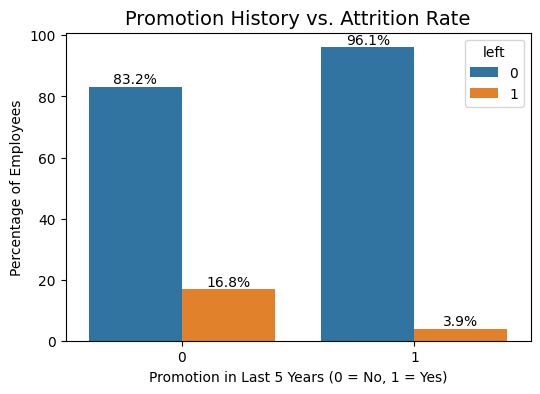

In [16]:
# Aggregate data to calculate attrition percentage by promotion history
promotion_counts = data_cleaned.groupby(['promotion_last_5years', 'left']).size().reset_index(name='count')
total_counts = promotion_counts.groupby('promotion_last_5years')['count'].sum().reset_index()
promotion_counts = promotion_counts.merge(total_counts, on='promotion_last_5years', suffixes=('', '_total'))
promotion_counts['percentage'] = (promotion_counts['count'] / promotion_counts['count_total']) * 100

# 📌 Grouped Bar Chart: Promotion History vs. Attrition Rate
plt.figure(figsize=(6, 4))
barplot = sns.barplot(x='promotion_last_5years', y='percentage', hue='left', data=promotion_counts)

# Add percentage labels
for container in barplot.containers:
    barplot.bar_label(container, fmt="%.1f%%", label_type="edge", fontsize=10)

# Set labels and title
plt.title("Promotion History vs. Attrition Rate", fontsize=14)
plt.xlabel("Promotion in Last 5 Years (0 = No, 1 = Yes)")
plt.ylabel("Percentage of Employees")

# Show plot
plt.show()

#### 🔍 ***Key Insights:***

**Employees without promotions face significantly higher attrition rates**:
* Employees who were not promoted in the last five years had an attrition rate of 16.8%, compared to just 3.9% among those who received promotions. This suggests that career progression plays a crucial role in employee retention.

**Promoted employees are far more likely to stay**:
* 96.1% of employees who were promoted remained with the company, reinforcing the strong link between career growth and long-term retention.

**Lack of promotion is a key driver of turnover**:
* Nearly one in six employees who did not receive a promotion left, highlighting the importance of internal career development and advancement opportunities.

**Promotion-based retention strategies could help reduce early attrition**:
* Employees who do not experience career growth may become disengaged and seek opportunities elsewhere. Addressing promotion gaps could be a key strategy for mitigating early turnover risks.

#### 💡 ***Summary:***

Employees who were not promoted in the last five years had a significantly higher attrition rate (16.8%) compared to those who were promoted (3.9%), reinforcing that career progression strongly influences retention. With 96.1% of promoted employees staying, the data highlights the importance of internal growth opportunities in reducing turnover. Addressing promotion gaps could be a key strategy in mitigating early attrition risks and improving long-term retention.

<br>

### 📊 **Years at Company Before Promotion (Stayed vs. Left)**  
**Goal**: Analyze how time to promotion impacts attrition.

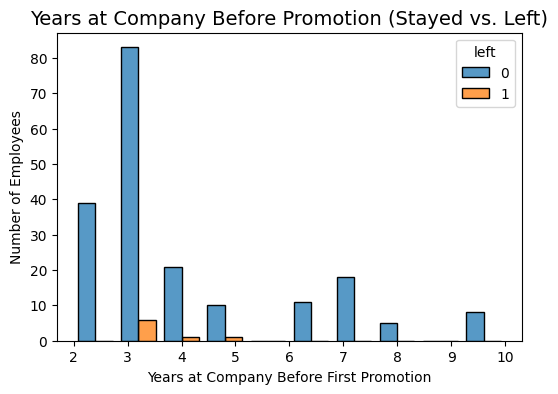

,company_tenure,left,count
0,2,0,39
1,3,0,83
2,3,1,6
3,4,0,21
4,4,1,1
5,5,0,10
6,5,1,1
7,6,0,11
8,7,0,18
9,8,0,5


In [17]:
# Filter employees who received a promotion
promoted_employees = data_cleaned[data_cleaned["promotion_last_5years"] == 1]

# 📌 Histogram: Years at Company Before Promotion (Stayed vs. Left)
plt.figure(figsize=(6, 4))
sns.histplot(data=promoted_employees, x="company_tenure", hue="left", kde=False, bins=10, multiple="dodge", shrink=0.8)

# Set labels and title
plt.title("Years at Company Before Promotion (Stayed vs. Left)", fontsize=14)
plt.xlabel("Years at Company Before First Promotion")
plt.ylabel("Number of Employees")

# Show plot
plt.show()

# 📌 Table: Count of Promotions by Tenure Year & Attrition Status
promotion_table = promoted_employees.groupby(["company_tenure", "left"]).size().reset_index(name="count")

# Display table
display(promotion_table)

#### 🔍 ***Key Insights:***

**Most promotions occur within the first three years**:
* The majority of employees who received promotions did so by year 3 (83 employees) or year 2 (39 employees), indicating that early-career advancement is common.

**A small percentage of promoted employees still left**:
* While promotions improve retention, a total of 8 employees who were promoted eventually left, mostly at years 3 and 4, suggesting that career growth alone does not guarantee long-term retention.

**Few employees receive promotions beyond year 5**:
* Promotions become significantly less frequent after 5 years, with only a handful occurring between years 6-10, reinforcing that most upward mobility happens early in tenure.

**Longer tenure promotions are strongly associated with retention**:
* Employees promoted after year 5 had a near 100% retention rate, suggesting that longer-term promotions may be given to highly committed employees or those in leadership tracks.

#### 💡 ***Summary:***

Most promotions occur within the first three years, with the highest number at year 3 (83 employees), indicating that early-career advancement is common. While promotions generally improve retention, a total of 8 promoted employees still left, primarily in years 3-4, suggesting that career growth alone does not guarantee long-term retention. Promotions beyond year 5 are rare, but those who receive them have a near 100% retention rate, reinforcing that longer-tenure promotions are often linked to committed employees or leadership tracks.

<br>

### 📊 **Promotion, Salary Growth & Attrition Flow (Sankey Diagram)**  
**Goal**: Visualize career progression paths and how they influence attrition.

In [18]:
# Prepare data for Sankey Diagram
sankey_data = data_cleaned.groupby(['salary', 'promotion_last_5years', 'left']).size().reset_index(name='count')

# Define unique labels (nodes)
labels = ["Low Salary", "Medium Salary", "High Salary", "Promoted", "Not Promoted", "Stayed", "Left"]
source = []
target = []
values = []

# Mapping categories to node indices
node_mapping = {
    'low': 0, 'medium': 1, 'high': 2,
    1: 3, 0: 4,  # Promotion status
    0: 5, 1: 6  # Attrition status
}

# Construct links for the Sankey diagram
for _, row in sankey_data.iterrows():
    # Salary → Promotion Status
    source.append(node_mapping[row["salary"]])
    target.append(node_mapping[row["promotion_last_5years"]])
    values.append(row["count"])

    # Promotion Status → Attrition Status
    source.append(node_mapping[row["promotion_last_5years"]])
    target.append(node_mapping[row["left"]])
    values.append(row["count"])

# 📌 Sankey Diagram: Promotion, Salary Growth & Attrition Flow
fig = go.Figure(go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=labels
    ),
    link=dict(
        source=source,
        target=target,
        value=values
    )
))

fig.update_layout(title_text="Promotion, Salary Growth & Attrition Flow", font_size=12)
fig.show()

In [19]:
# Aggregate the Data: Count employees in each transition path
sankey_data = data_cleaned.groupby(['salary', 'promotion_last_5years', 'left']).size().reset_index(name='count')

# Rename columns for clarity
sankey_data.columns = ["Initial Salary Level", "Promoted in Last 5 Years (1=Yes, 0=No)", "Attrition (1=Left, 0=Stayed)", "Employee Count"]

# Display the DataFrame
display(sankey_data)  # Works in Jupyter Notebook

,Initial Salary Level,"Promoted in Last 5 Years (1=Yes, 0=No)","Attrition (1=Left, 0=Stayed)",Employee Count
0,high,0,0,898
1,high,0,1,48
2,high,1,0,44
3,low,0,0,4533
4,low,0,1,1169
5,low,1,0,33
6,low,1,1,5
7,medium,0,0,4374
8,medium,0,1,766
9,medium,1,0,118


#### 🔍 ***Key Insights:***

**Higher salaries strongly correlate with lower attrition**:
* Out of 990 employees with high salaries, only 49 left (4.9%), reinforcing that higher compensation significantly reduces turnover.

**Low-salary employees have the highest attrition risk**:
* Among 5,740 employees with low salaries, 1,207 left (21%), indicating that lower compensation is a major driver of attrition.

**Medium-salary employees fall between both extremes**:
* Of the 5,732 employees with medium salaries, 121 left (2.1%), showing that attrition is significantly lower than in the low-salary group but still higher than in the high-salary group.

**Promoted employees in all salary groups have very low attrition**:
* Only 1 promoted employee (out of 48 medium and high-salary promotions) left, confirming that career progression is a strong retention factor.

**The strongest retention is among high-salary earners who were promoted**:
* Every high-salary employee who was promoted in the last five years stayed, supporting the case for both salary and career advancement as key retention drivers.

#### 💡 ***Summary:***

Higher salaries significantly reduce attrition, with only 4.9% of high-salary employees leaving compared to 21% of low-salary employees. Medium-salary employees fall between both extremes, with a 2.1% attrition rate. Career progression plays a critical role in retention, as only 1 promoted employee (out of 48 promotions) left. Notably, every high-salary employee who was promoted remained, reinforcing that both competitive pay and career growth are key to long-term retention.

<br>

## **7️⃣ Job Satisfaction & Employee Retention**
### 📊 **Satisfaction Trends by Tenure (Stayed vs. Left)**
**Goal**: Analyze how job satisfaction changes over an employee's tenure and its potential impact on retention.

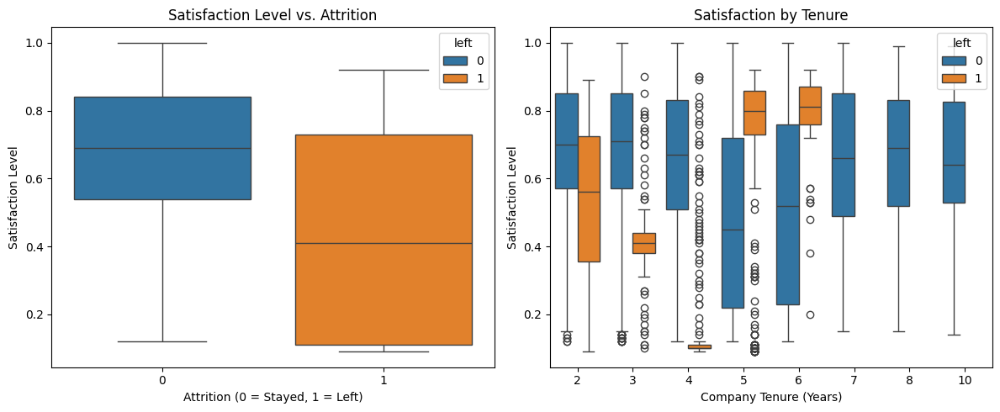

In [20]:
# Set figure size and layout for subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# 📌 Boxplot 1: Satisfaction Level vs. Attrition
sns.boxplot(x='left', y='satisfaction_level', data=data_cleaned, hue='left', ax=axes[0])
axes[0].set_title("Satisfaction Level vs. Attrition")
axes[0].set_xlabel("Attrition (0 = Stayed, 1 = Left)")
axes[0].set_ylabel("Satisfaction Level")

# 📌 Boxplot 2: Satisfaction by Tenure
sns.boxplot(data=data_cleaned, x="company_tenure", y="satisfaction_level", hue="left")
axes[1].set_title("Satisfaction by Tenure")
axes[1].set_xlabel("Company Tenure (Years)")
axes[1].set_ylabel("Satisfaction Level")

# Adjust layout for readability
plt.tight_layout()
plt.show()

#### 🔍 ***Key Insights:***

**Lower satisfaction is a strong predictor of attrition:**
* Employees who left had a much lower median satisfaction level (0.4) compared to those who stayed (0.65-0.7), reinforcing that dissatisfaction is a major driver of turnover.

**High satisfaction is more common among retained employees:**
* Employees who stayed tend to have higher satisfaction scores, with a median around 0.7, and a broader range extending to nearly 1.0, suggesting that higher job satisfaction correlates with long-term retention.

**Satisfaction varies widely by tenure, with sharp declines in certain groups:**
* Employees leaving around years 3-4 show notably low satisfaction levels, aligning with previous insights that early-career disengagement is a key attrition risk.
* While employees with 6+ years of tenure have relatively stable satisfaction, their median satisfaction is still lower than that of employees who stayed in year 3.
* Satisfaction slightly declines from year 8 onward, suggesting that long tenure does not guarantee increased satisfaction, and other factors (e.g., job stability, external opportunities) may play a role in retention.

**There is a dissatisfied subset of long-tenured employees who remain:**
* Despite overall higher satisfaction among long-tenured employees, some outliers with very low satisfaction remain, possibly due to job security, benefits, or lack of external opportunities.

#### 💡 ***Summary:***

Lower satisfaction strongly correlates with attrition, as employees who left had a median satisfaction level of 0.4 compared to 0.7 for those who stayed. Satisfaction dips sharply among employees leaving at 3-4 years, reinforcing early-career disengagement as a key risk. While long-tenured employees (6+ years) generally show stable retention, their median satisfaction remains lower than employees who stayed in year 3. Additionally, satisfaction slightly declines from year 8 onward, indicating that extended tenure is not necessarily driven by increasing satisfaction but may be influenced by job stability, benefits, or fewer external opportunities.

<br>

### 📊 **Performance vs. Satisfaction (Last Evaluation Score Comparison)**
**Goal**: Determine if high-performing employees are more or less satisfied with their jobs.

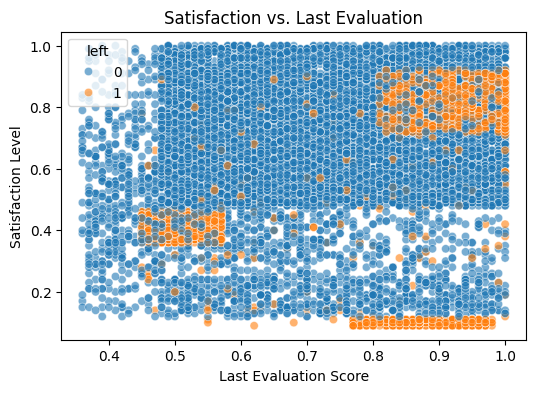

In [21]:
# 📌 Scatterplot: Satisfaction vs. Last Evaluation
plt.figure(figsize=(6, 4))
sns.scatterplot(data=data_cleaned, x="last_evaluation", y="satisfaction_level", alpha=0.6, hue="left")

# Set title and labels
plt.title("Satisfaction vs. Last Evaluation")
plt.xlabel("Last Evaluation Score")
plt.ylabel("Satisfaction Level")

# Show plot
plt.show()

#### 🔍 ***Key Insights:***

**This Scatterplot:**
* A cluster of leavers (orange points) around satisfaction levels below 0.5 and last evaluation scores below 0.6 suggests that dissatisfaction and underperformance heighten attrition risk.
* A concentration of leavers with high evaluation scores (0.8–1.0) but low satisfaction (<0.2) highlights that even top performers are at risk of leaving when dissatisfied.
* Employees with evaluation scores above 0.5 and satisfaction levels above 0.5 overwhelmingly stay, confirming strong retention among engaged employees.

**This scatter plot exhibits a similar pattern to previous scatterplots, reinforcing a correlation between high satisfaction leavers and three key factors:**
* **Overworked employees (225-300+ hours/month)**
    * Employees who left despite high satisfaction tended to work significantly higher-than-average monthly hours, reinforcing workload stress as a key attrition driver.
* **High last evaluation scores (>0.8)**
    * Many of these overworked leavers also had strong performance ratings, indicating they were engaged and delivering results before exiting.
* **Lack of promotions in the last 5 years**
    * The third scatterplot confirms that almost none of these high-performing, overworked leavers had received a promotion, suggesting that career stagnation despite strong contributions played a role in their decision to leave.

#### 💡 ***Summary:***
Employees who left were concentrated in two key areas—low satisfaction (<0.5) and low last evaluation scores (<0.6), reinforcing that dissatisfaction and underperformance heighten attrition risk. Additionally, even high-performing employees (>0.8 last evaluation) with extremely low satisfaction (<0.2) were at risk of leaving, confirming that strong performance alone does not guarantee retention.

This scatter plot also reflects broader patterns seen in previous analyses, where overworked employees (225-300+ hours/month) who maintained strong performance ratings (>0.8) but lacked promotions in the last five years were highly susceptible to attrition. Employees with evaluation scores above 0.5 and satisfaction levels above 0.5 overwhelmingly stayed, reinforcing that engagement—both in terms of job satisfaction and recognition—plays a crucial role in retention.

<Br>

## **8️⃣ Departmental Trends & Attrition Risk**
**Goal**: Identify which departments experience the highest attrition risk and explore factors like salary distribution and satisfaction that may contribute to turnover.

### 📊 **Departmental Attrition Rates**
**Goal**: Evaluate which departments experience the highest attrition.

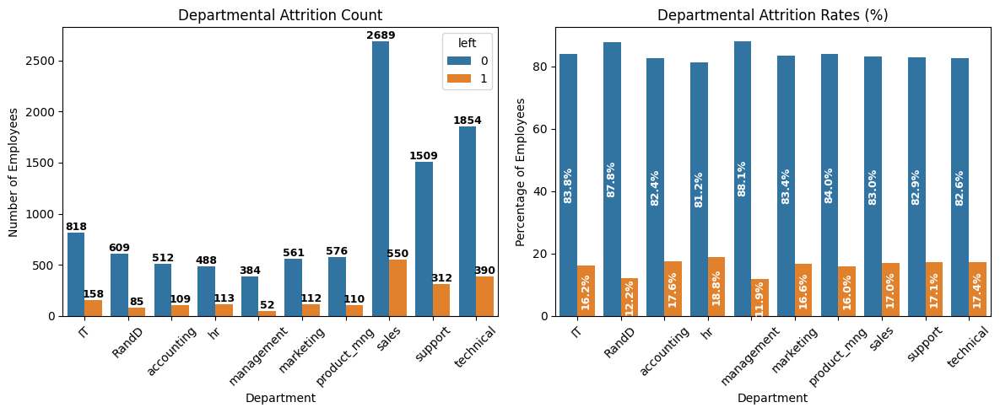

In [22]:
# Aggregate data: Count employees per department by attrition status
department_attrition = data_cleaned.groupby(['department', 'left']).size().reset_index(name='count')

# Normalize to get attrition percentage per department
total_counts = department_attrition.groupby('department')['count'].sum().reset_index()
department_attrition = department_attrition.merge(total_counts, on='department', suffixes=('', '_total'))
department_attrition['percentage'] = (department_attrition['count'] / department_attrition['count_total']) * 100

# Set figure and subplots layout
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# 📌 Subplot 1: Stacked Bar Chart - Employee Count
sns.barplot(x='department', y='count', hue='left', data=department_attrition, ax=axes[0])
axes[0].set_title("Departmental Attrition Count")
axes[0].set_xlabel("Department")
axes[0].set_ylabel("Number of Employees")

# Rotate department labels correctly
axes[0].set_xticks(range(len(department_attrition['department'].unique())))
axes[0].set_xticklabels(department_attrition['department'].unique(), rotation=45)

# Add count labels on bars
for container in axes[0].containers:
    axes[0].bar_label(container, fmt="%.0f", label_type="edge", fontsize=9, fontweight="bold")

# 📌 Subplot 2: Stacked Bar Chart - Percentage
sns.barplot(x='department', y='percentage', hue='left', data=department_attrition, ax=axes[1])
axes[1].set_title("Departmental Attrition Rates (%)")
axes[1].set_xlabel("Department")
axes[1].set_ylabel("Percentage of Employees")
axes[1].legend_.remove()

# Rotate department labels correctly
axes[1].set_xticks(range(len(department_attrition['department'].unique())))
axes[1].set_xticklabels(department_attrition['department'].unique(), rotation=45)

# Add percentage labels on bars
for container in axes[1].containers:
    axes[1].bar_label(container, fmt="%.1f%%", label_type="center", fontsize=9, rotation=90, color="white", fontweight="bold")

# Adjust layout for better spacing
plt.tight_layout()
plt.show()

#### 🔍 ***Key Insights:***

**Attrition rates are relatively uniform across departments:**
* Ranging from 11.9% (management) to 18.8% (HR), with management experiencing the lowest attrition and HR the highest.

**Sales has the highest overall employee count:**
* And the highest number of employees leaving, but its attrition rate (17.0%) remains within the middle range, meaning its size—not disproportionate turnover—drives the high exit count.

**HR and Accounting show some of the highest attrition rates (18.8% and 17.6% respectively):**
* This suggests potential challenges in retaining employees in these functions.

**Management has the lowest attrition rate (11.9%):**
* This reinforces that leadership roles tend to have greater stability compared to other functions.

#### 💡 ***Summary:***

Attrition rates are fairly consistent across departments, with management experiencing the lowest attrition (11.9%) and HR the highest (18.8%). While Sales has the highest number of employees leaving, its attrition rate remains within the mid-range (17.0%), indicating that its high exit numbers are a function of size rather than excessive turnover. HR and Accounting show some of the highest attrition rates, suggesting potential retention challenges in these functions.

<br>

### 📊 **Satisfaction by Department**
**Goal**: Evaluate which departments experience the highest satisfaction.

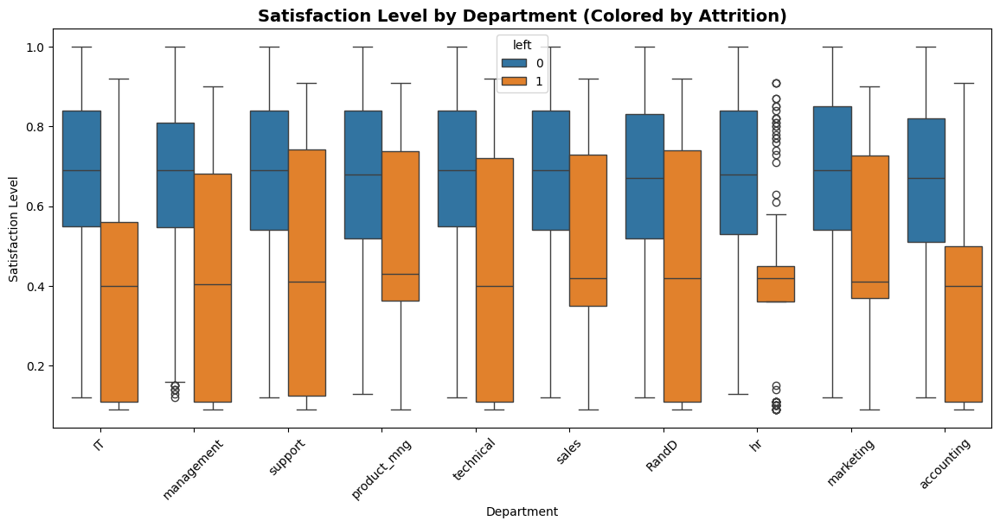

In [23]:
# 📌 Boxplot: Satisfaction by Department (Colored by Attrition)
plt.figure(figsize=(14, 6))
sns.boxplot(data=data_cleaned, x="department", y="satisfaction_level", hue="left")

# Set labels and title
plt.title("Satisfaction Level by Department (Colored by Attrition)", fontsize=14, fontweight="bold")
plt.xlabel("Department")
plt.ylabel("Satisfaction Level")
plt.xticks(rotation=45)  # Rotate department names for readability

# Show plot
plt.show()

#### 🔍 ***Key Insights:***

* **Leavers in all departments have significantly lower satisfaction levels:** compared to those who stayed, with median satisfaction scores well below 0.5 across departments.
* **HR stands out with an exceptionally low satisfaction distribution among leavers**, with a notably compressed range, indicating widespread dissatisfaction in that department.
* **Satisfaction levels among leavers in technical, IT, and management roles show a wider spread**, suggesting that while many were dissatisfied, some left despite having moderate satisfaction levels.
* **Marketing and support departments also exhibit a clear gap between those who stayed and those who left**, reinforcing the impact of job satisfaction on retention across multiple functions.
* **Overall, higher satisfaction is strongly linked to retention across all departments**, highlighting the importance of job fulfillment in reducing attrition risk.

#### 💡 ***Summary:***
Satisfaction levels strongly correlate with attrition across all departments, with employees who left consistently reporting much lower satisfaction. HR exhibits particularly low satisfaction among leavers, suggesting a systemic challenge in employee experience. Meanwhile, technical, IT, and management roles show a broader spread, indicating that attrition is not always tied to extreme dissatisfaction but may involve other factors such as workload or career stagnation.

<br>

### 📊 **Salary Attrtion Trends by Department**
**Goal**: Determine if salary is a particular issue for specific departments.

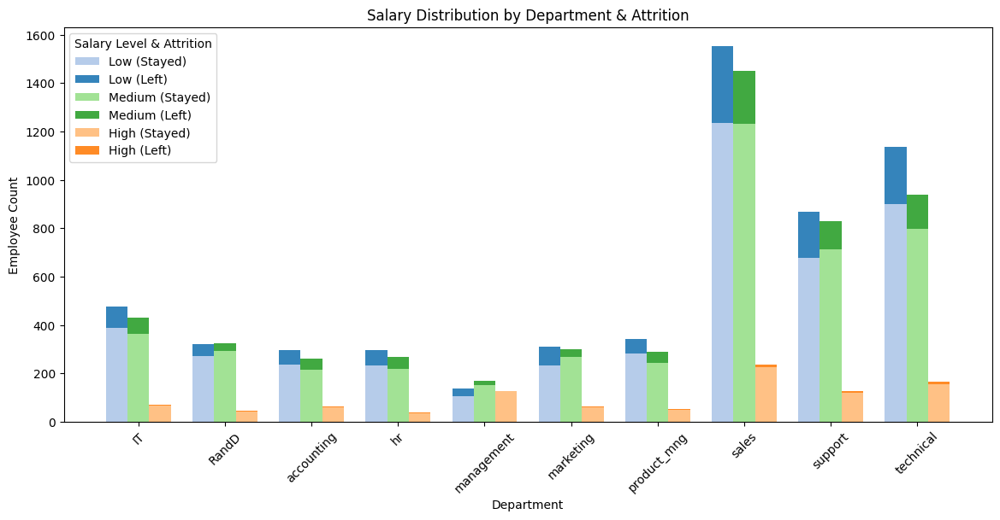

In [24]:
# Aggregate data: Count employees per department, salary level, and attrition status
salary_attrition = data_cleaned.groupby(['department', 'salary', 'left']).size().reset_index(name='count')

# Pivot the data for stacking
salary_attrition_pivot = salary_attrition.pivot_table(index=['department', 'salary'], columns='left', 
                                                      values='count', fill_value=0).reset_index()
salary_attrition_pivot.columns = ['department', 'salary', 'stayed', 'left']

# Define salary order
salary_order = ['low', 'medium', 'high']

# Define custom colors for salary levels
salary_colors = {
    'low': ("#aec7e8", "#1f77b4"),     # Light blue (Stayed), Dark blue (Left)
    'medium': ("#98df8a", "#2ca02c"),  # Light green (Stayed), Dark green (Left)
    'high': ("#ffbb78", "#ff7f0e")     # Light orange (Stayed), Dark orange (Left)
}

# Set figure size
fig, ax = plt.subplots(figsize=(14, 6))

# Define bar width and x locations for departments
bar_width = 0.25
departments = salary_attrition_pivot['department'].unique()
x = np.arange(len(departments))

# 📌 Plot each salary group separately
for i, salary in enumerate(salary_order):
    salary_data = salary_attrition_pivot[salary_attrition_pivot['salary'] == salary]
    
    # Bars for employees who stayed
    bars_stayed = ax.bar(x + (i - 1) * bar_width, salary_data['stayed'], width=bar_width, 
                         label=f"{salary.capitalize()} (Stayed)", color=salary_colors[salary][0], alpha=0.9)

    # Bars for employees who left (stacked on stayed)
    bars_left = ax.bar(x + (i - 1) * bar_width, salary_data['left'], width=bar_width, 
                       bottom=salary_data['stayed'], label=f"{salary.capitalize()} (Left)", color=salary_colors[salary][1], alpha=0.9)

# 📌 Set labels and title
ax.set_title("Salary Distribution by Department & Attrition")
ax.set_xlabel("Department")
ax.set_ylabel("Employee Count")
ax.set_xticks(x)
ax.set_xticklabels(departments, rotation=45)  # Rotate department names for readability

# Add legend
ax.legend(title="Salary Level & Attrition", loc='upper left', fontsize=10)

# Show plot
plt.show()

In [25]:
# 📌 Table: Salary Distribution by Department & Attrition
salary_summary_table = data_cleaned.groupby(['department', 'salary', 'left']).size().reset_index(name='count')

# Calculate total employees per department & salary level
total_counts = salary_summary_table.groupby(['department', 'salary'])['count'].sum().reset_index(name='total_count')

# Merge total counts back to the main table
salary_summary_table = salary_summary_table.merge(total_counts, on=['department', 'salary'])

# Calculate percentage of employees who left or stayed
salary_summary_table['percentage'] = ((salary_summary_table['count'] / salary_summary_table['total_count']) * 100).round(2)

# Sort by highest attrition percentage (only for employees who left)
top_3_left = salary_summary_table[salary_summary_table['left'] == 1].nlargest(3, 'percentage')

# Define highlighting function
def highlight_top_rows(row):
    return ['background-color: yellow' if row.name in top_3_left.index else '' for _ in row]

# Display table with highlighting
display(salary_summary_table.style.apply(highlight_top_rows, axis=1))

,department,salary,left,count,total_count,percentage
0,IT,high,0,67,71,94.370000
1,IT,high,1,4,71,5.630000
2,IT,low,0,389,476,81.720000
3,IT,low,1,87,476,18.280000
4,IT,medium,0,362,429,84.380000
5,IT,medium,1,67,429,15.620000
6,RandD,high,0,44,47,93.620000
7,RandD,high,1,3,47,6.380000
8,RandD,low,0,271,322,84.160000
9,RandD,low,1,51,322,15.840000


#### 🔍 ***Key Insights:***

**Low-salary employees face the highest attrition risk across departments:**
* Management (23.0%), Marketing (24.5%), and Support (22.0%) have the highest attrition rates for low-salary employees.
* Sales also exhibits a high count of low-salary exits (20.5%), indicating a trend across multiple departments.
* These departments may face retention challenges due to compensation dissatisfaction.

**High salaries strongly correlate with retention:**
* In every department, employees with high salaries show significantly lower attrition rates, reinforcing the role of financial incentives in long-term retention.

**Salary progression may play a role in retention:**
* Departments with high attrition at lower salary levels also have fewer high-salary employees, suggesting that limited career advancement could be a contributing factor.

#### 💡 ***Summary:***

Low-salary employees consistently exhibit the highest attrition risk, particularly in Management (23.0%), Marketing (24.5%), and Support (22.0%), where turnover is notably high. This indicates potential dissatisfaction with compensation. In contrast, high salaries are strongly correlated with retention, as attrition rates remain minimal for high earners across all departments. These trends suggest that salary progression and career advancement opportunities are critical factors in employee retention.

<br>

### 📊 **Tenure vs. Department vs. Attrition**
**Goal**: Pinpoint tenure phases where departmental attrition peaks.

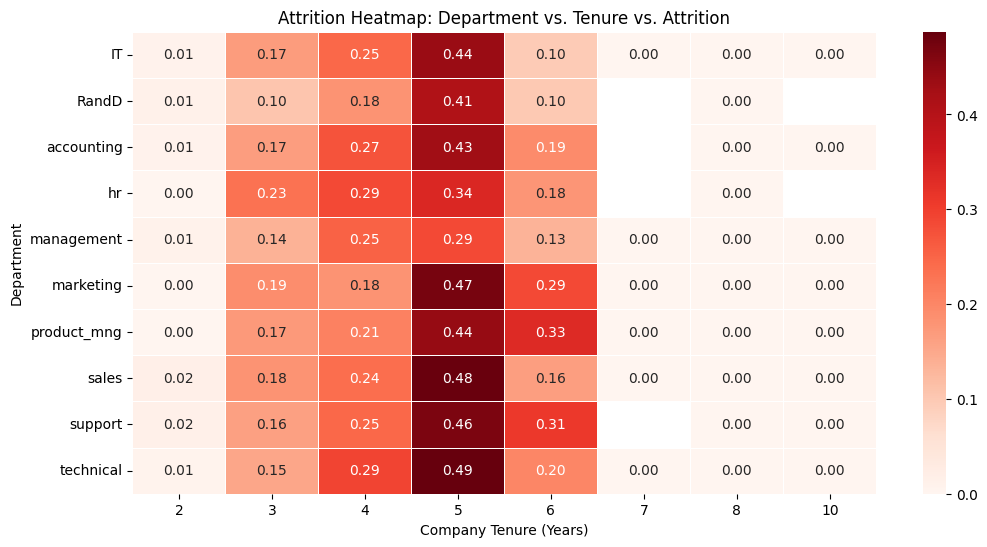

In [26]:
# Aggregate data: Calculate attrition rate per department and tenure
attrition_heatmap_data = (
    data_cleaned.groupby(["department", "company_tenure"])["left"]
    .mean()
    .unstack()  # Reshape for heatmap
)

# Set figure size
plt.figure(figsize=(12, 6))

# 📌 Heatmap: Department vs. Tenure vs. Attrition
sns.heatmap(attrition_heatmap_data, annot=True, cmap="Reds", fmt=".2f", linewidths=0.5)

# Labels & Title
plt.title("Attrition Heatmap: Department vs. Tenure vs. Attrition")
plt.xlabel("Company Tenure (Years)")
plt.ylabel("Department")

# Show plot
plt.show()

#### 🔍 ***Key Insights:***

**Attrition peaks at 4-5 years across most departments:**
* The highest attrition rates are observed around 4-5 years of tenure, with Sales (48%), Technical (49%), Support (46%), and Marketing (47%) experiencing particularly high turnover in this range.

**Sales and Technical roles exhibit the highest mid-career attrition:**
* Employees in Sales (48%) and Technical (49%) roles show the most significant dropout rates at 4-5 years, indicating potential issues with workload, career growth, or job satisfaction.

**Attrition drops significantly beyond 6 years:**
* Most departments see a sharp decline in attrition after the 5-year mark, suggesting that employees who remain beyond this point are more likely to stay long-term.

**HR, Accounting, and Support show elevated attrition risks at 3-5 years:**
* HR (34%), Accounting (43%), and Support (46%) face heightened turnover risks in mid-tenure, potentially due to job dissatisfaction, compensation, or career stagnation.

#### 💡 ***Summary:***

Attrition is highest around 4-5 years of tenure, particularly in Sales (48%), Technical (49%), and Support (46%), suggesting mid-career challenges in these roles. HR and Accounting also experience notable attrition at this stage, pointing to possible career growth or satisfaction concerns. However, as we've seen in previous charts, attrition rates drop significantly after 6 years, indicating that employees who stay beyond this point are more likely to remain long-term.

<br>

## **9️⃣ Correlation & Predictive Factors**
**Goal**: Identify key predictors of attrition by analyzing feature relationships.

### 📊 **Correlation Heatmap & Model-Ready Data**  
**Goal**: Identify which variables have strong correlations with attrition, guiding feature selection for modeling.

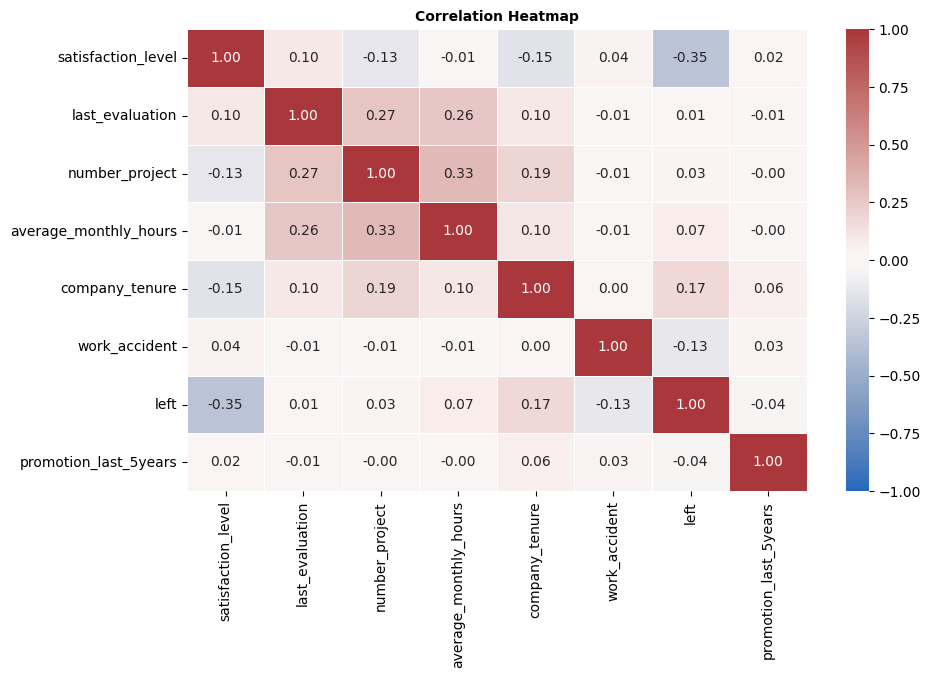

In [27]:
# Compute the correlation matrix, ignoring non-numeric columns
corr_matrix = data_cleaned.corr(numeric_only=True)

# 📌 Correlation Heatmap:
plt.figure(figsize=(10, 6))
sns.heatmap(corr_matrix, annot=True, cmap="vlag", fmt=".2f", linewidths=0.5, vmin=-1, vmax=1)
plt.title("Correlation Heatmap", fontsize=10, fontweight="bold")
plt.show()

#### 🔍 ***Key Insights:***

**Satisfaction level has the strongest negative correlation with attrition (-0.35):**
* Employees with lower satisfaction levels are more likely to leave, reinforcing job dissatisfaction as a major attrition driver.

**Company tenure has a weak positive correlation with attrition (0.17):**
* While tenure slightly increases with attrition, it suggests that employees may leave after a certain period, possibly due to stagnation or lack of career progression.

**Number of projects and average monthly hours show moderate correlations (0.27 and 0.33, respectively) with last evaluation scores:**
* Employees handling more projects and working longer hours tend to have higher evaluation scores, indicating that performance assessments are linked to workload.

**Promotions in the last five years show almost no correlation with attrition (-0.04):**
* This suggests that while lack of promotion may contribute to dissatisfaction, it is not a direct predictor of employees leaving.

#### 💡 ***Summary:***

Job satisfaction is the strongest predictor of attrition, with lower satisfaction levels significantly correlating with higher employee exits (-0.35). While tenure shows a slight positive correlation (0.17) with attrition, suggesting some mid-career exits, promotions in the last five years appear to have little direct influence on retention. Additionally, employees with high last evaluation scores tend to handle more projects and work longer hours, indicating that performance is closely tied to workload.

<br>

## **🔟 Summary of Insights**

Salifort Motors is experiencing a moderate turnover rate (16.6%), with 1 in 6 employees leaving, significantly impacting hiring costs, workforce stability, and productivity. Attrition is highest between 4-6 years of tenure, particularly among high-performing employees whose last evaluation scores peak before departure. This suggests a lack of career progression and recognition as major attrition drivers. Additionally, promotion gaps play a critical role—employees who were not promoted in the last five years had a 16.8% attrition rate, while those promoted had a retention rate of 96.1%. High salaries also strongly correlate with retention, reinforcing financial incentives and career growth as key levers for reducing turnover.

Workload balance and satisfaction levels are critical retention factors. Attrition peaks at moderate workloads (125-160 hours/month), often due to disengagement or underperformance, while burnout-driven exits become unavoidable at 7+ projects (250+ hours/month). Employees who left experienced erratic workload fluctuations, with a drop at Year 3 (160 hours) followed by a spike at Year 4 (270 hours), mirroring performance declines and reinforcing burnout as a major risk. Furthermore, low satisfaction is the strongest predictor of attrition—employees who left had a median satisfaction of 0.4, compared to 0.7 for those who stayed. Workplace accidents appear to have minimal impact on attrition, as employees with accident histories leave at slightly lower rates than those without. Notably, even high-performing employees (>0.8 last evaluation) with extremely low satisfaction (<0.2) were at risk of leaving, confirming that strong performance alone does not guarantee retention.

Attrition trends vary by department, salary level, and tenure. Management sees the lowest attrition (11.9%), while HR faces the highest (18.8%), with dissatisfaction levels particularly low among HR leavers. Low-salary employees consistently exhibit the highest turnover risk, especially in Management (23.0%), Marketing (24.5%), and Support (22.0%), indicating potential dissatisfaction with compensation. Conversely, high salaries and career advancement opportunities significantly reduce attrition. These findings emphasize the need for strategic retention efforts, including structured promotion pathways, competitive compensation, and workload balance policies to mitigate turnover risks, enhance engagement, and improve long-term workforce stability.

<br>

## **1️⃣1️⃣ Business Recommendations to Reduce Attrition at Salifort Motors**

1. **Strengthen Early-Career Retention Strategies (Years 2-4)**
    * Implement structured career development programs, mentorship initiatives, and internal mobility opportunities to engage employees early.
    * Enhance progression incentives and growth pathways to reduce attrition risk, particularly at the 3-year mark, where voluntary exits peak.
2. **Retain High Performers (Years 4-6) with Career Growth & Recognition**
    * Introduce promotion pathways, leadership training, and high-impact projects to incentivize top performers to stay.
    * Conduct salary reassessments and performance-based bonuses at Years 4-5 to ensure competitive compensation and prevent turnover due to external job offers.
    * Conduct Stay Interviews at Year 4 to identify top talent at risk and adjust retention strategies accordingly.
3. **Address Performance-Related Departures at Year 3**
    * If poor performance is driving attrition at 3 years, assess training gaps, job expectations, and hiring practices to ensure employees are set up for success.
    * Implement personalized performance coaching and tailored development plans for employees at risk of disengagement.
    * Introduce regular performance check-ins & peer mentorship programs to support employees through early-career challenges.
4. **Prevent Burnout & Optimize Workload Balance**
    * Limit excessive workloads, particularly beyond 250+ hours/month, as burnout is a primary driver of attrition.
    * Establish workload management strategies such as project distribution adjustments, workload caps, and flexible scheduling to reduce attrition risks tied to overwork.
    * Optimize project allocation to prevent erratic workload fluctuations and sudden overwork periods.
    * Introduce mandatory recovery periods or additional PTO allowances for employees in high-burnout roles.
5. **Leverage Stability of Long-Tenured Employees (7+ Years)**
    * Utilize experienced employees as mentors, career advisors, or internal knowledge resources to support workforce development.
    * Reinforce long-term retention strategies by offering career acceleration opportunities, leadership roles, and long-term financial incentives to sustain engagement.
    * Expand later-tenure promotion opportunities & role diversification programs to prevent stagnation.
6. **Strengthen Compensation & Promotion Policies**
    * Employees who were not promoted in the last five years have a significantly higher attrition rate (16.8%). Address promotion gaps to reduce early attrition risks.
    * Since higher salaries strongly correlate with retention, ensure competitive pay structures and salary progression to minimize turnover, especially among low and mid-salary employees in high-risk departments like HR, Marketing, and Support.
    *  Introduce Personalized Compensation Reviews with customized salary benchmarks & tenure-based incentives to prevent salary-driven exits.

<br>

## **1️⃣2️⃣ Conclusion**

Salifort Motors’ employee attrition analysis reveals clear, data-driven insights into the key drivers of turnover, particularly among early-career employees (Years 2-4), mid-tenure high performers (Years 4-6), and those facing workload imbalances or career stagnation. The findings highlight that promotion gaps, workload fluctuations, lack of career growth, and salary dissatisfaction are major contributors to attrition.

By implementing targeted retention strategies, including structured career development, proactive workload management, competitive compensation, and leadership pathways, Salifort Motors can reduce hiring costs, improve workforce stability, and retain top talent. Moving forward, these insights will guide HR and leadership teams in making informed, data-backed decisions to strengthen employee engagement and long-term retention. 